

# 🩻 Using Transfer Learning and TensorFlow to Classify Chest X-Rays

Who's that in the X-ray?

X-rays are powerful tools used by doctors to diagnose internal health conditions. But have you ever looked at one and had no idea what it meant? I have. And then a doctor says, “it’s pneumonia” and you wonder—how did they know that?

In this project, we're going to use machine learning to help us interpret chest X-rays and identify different conditions like **COVID-19**, **Pneumonia**, or **Normal/Healthy** lungs.

To do this, we’ll use a labeled dataset from Kaggle that contains thousands of X-ray images across different classes. These images are labeled according to what condition (if any) is present in the scan.

This kind of problem is called **multi-class image classification**. It’s multi-class because we’re trying to predict one of several categories (COVID-19, Pneumonia, Normal). If we were only trying to detect healthy vs sick lungs, it would be binary classification.

Multi-class image classification like this is crucial in real-world applications—automated health screening, diagnostic tools in rural areas, and augmenting radiologists' capabilities.

Since the most important step in any deep learning project is getting the data ready (turning it into numbers the model can learn from), that’s exactly where we’ll start.

We're going to go through the following TensorFlow/Deep Learning workflow:

* **Get data ready** (download from Kaggle, store, import).
* **Prepare the data** (preprocessing, train/validation/test splits, X & y).
* **Choose and fit/train a model** (using pretrained models from TensorFlow Hub or `tf.keras.applications`, with support from TensorBoard and EarlyStopping).
* **Evaluate the model** (make predictions and compare them with the true labels).
* **Improve the model through experimentation** (start with a subset of 1000 images to confirm everything works, then scale up).
* **Save, share, and reload your model** (once you’re happy with the results).

For the machine learning model itself, we’ll use a **pretrained deep learning model** from TensorFlow Hub.

This approach is called **transfer learning**—instead of training our own model from scratch (which is resource-intensive), we’ll leverage a model already trained on millions of images, and adapt it to our problem.


# Getting Our Workspace Ready


In [1]:
# Checking the versions of Tensorflow and Tensorflow Hub

import tensorflow as tf
import tensorflow_hub as hub
print("Tf Version : ",tf.__version__)
print("HUb Version: ",hub.__version__)

#Checking if GPU is available or not

print("GPU","is availabe"if tf.config.list_physical_devices("GPU") else ("is not available"))

Tf Version :  2.18.0
HUb Version:  0.16.1
GPU is availabe


# Getting our Data Ready

In [2]:
#Mounting our Drive
from google.colab import drive
drive.mount("/content/drive")



Mounted at /content/drive


# Unzipping the Zip File giving the destination Folder

In [3]:
!unzip "/content/drive/MyDrive/X-rays/Data.zip" -d "/content/drive/MyDrive/X-rays"

Archive:  /content/drive/MyDrive/X-rays/Data.zip
replace /content/drive/MyDrive/X-rays/test/COVID19/COVID19(460).jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# Accessing our Data
## Now the data files we're working with are available on our Google Drive, we can start to check it out.


In [4]:
import os
import matplotlib.pyplot as plt

dataset_path="/content/drive/MyDrive/X-rays/train"

image_count={}

categories=["COVID19","NORMAL","PNEUMONIA"]

for category in categories:
  folder_path =os.path.join(dataset_path,category)
  count=len([
      file for file in os.listdir(folder_path)
      if os.path.isfile(os.path.join(folder_path,file))
  ])
  image_count[category]=count

image_count



{'COVID19': 460, 'NORMAL': 1266, 'PNEUMONIA': 3418}

# Visualising Our Training Dataset

##Plotting a Graph Between No.Of X-Rays and Types of Patients

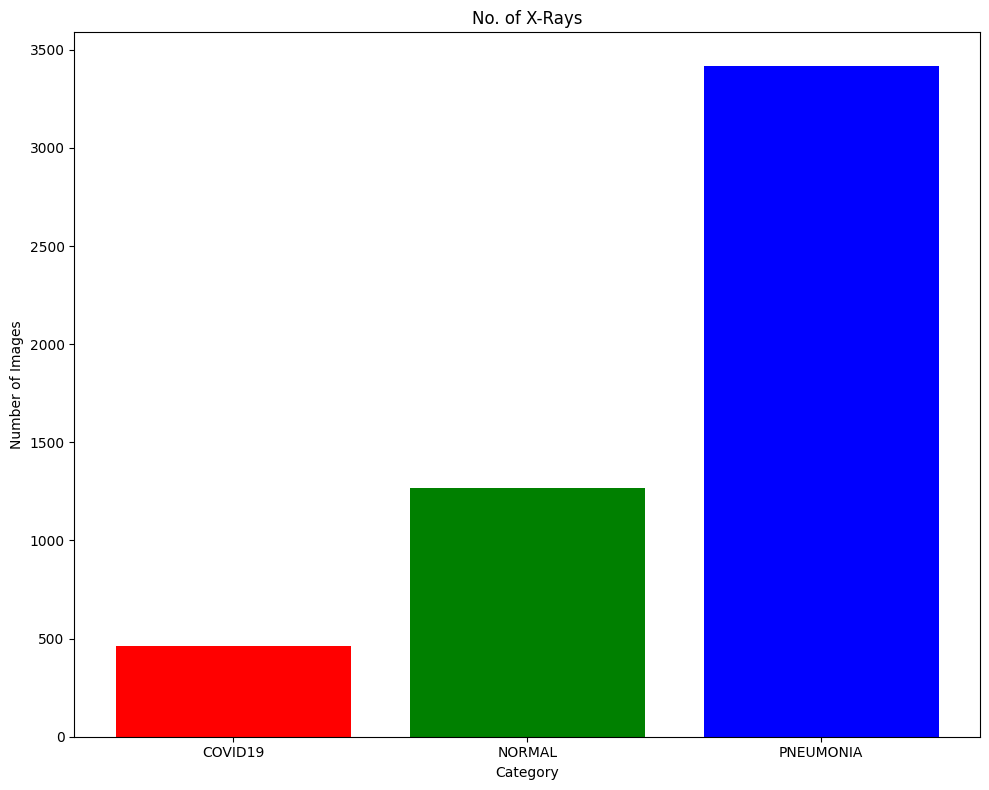

In [5]:
plt.figure(figsize=(10,8))
plt.bar(image_count.keys(),image_count.values(),color=["Red","Green","Blue"])
plt.xticks()
plt.yticks()
plt.title("No. of X-Rays")
plt.xlabel('Category')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.show()


# Visualising a Sample X-Ray

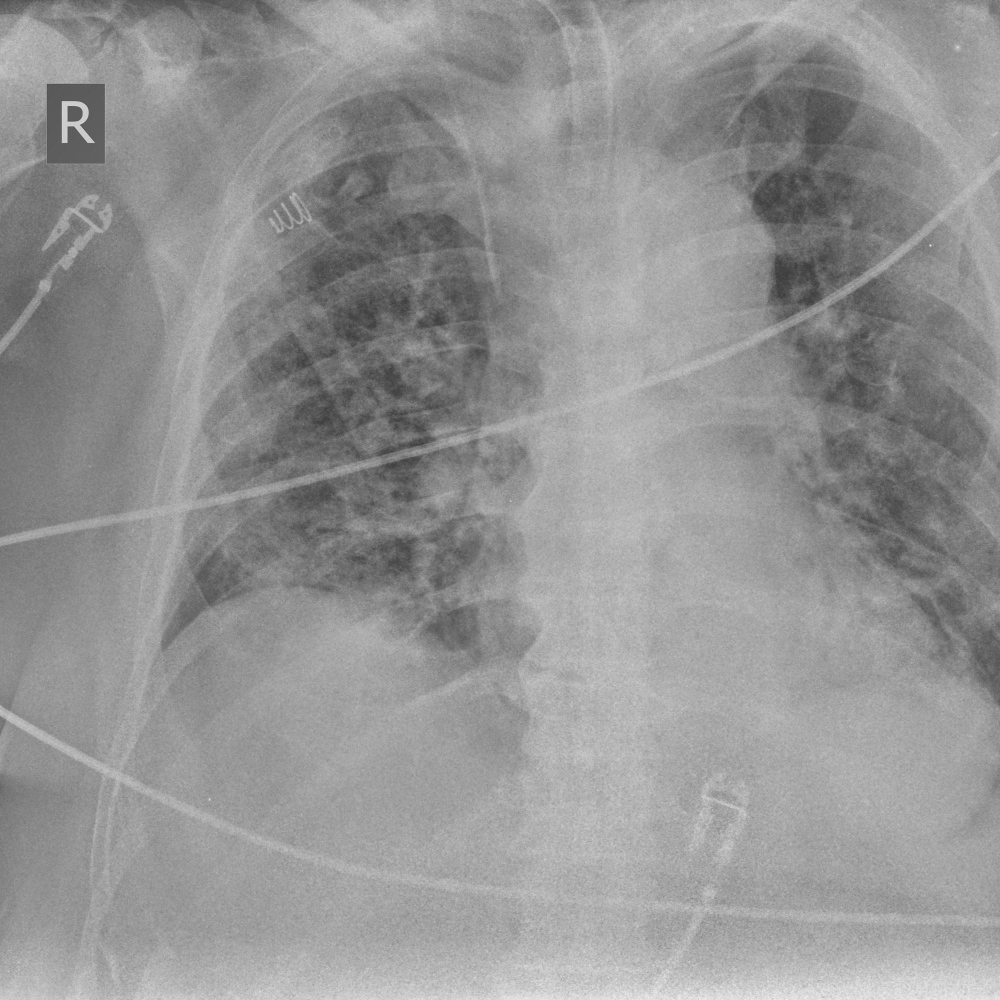

In [6]:
from IPython.display import Image,display

Image("/content/drive/MyDrive/X-rays/train/COVID19/COVID19(0).jpg")

In [7]:
import numpy as np
labels=["COVID19","NORMAL","PNEUMONIA"]

unique_cases=np.unique(labels)
unique_cases

array(['COVID19', 'NORMAL', 'PNEUMONIA'], dtype='<U9')

# Preprocessing Image by ImageDataGenerator from Tensorflow Keras
## 🔄 Load, preprocess, and optionally augment image data for training, validation, or testing.
## ✅ Key uses:
1.Rescale pixel values (e.g., from 0–255 to 0–1)

2.Augment images during training (rotate, zoom, shift, flip, etc.)

3.Generate batches of images and labels automatically from folders



In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [11]:
traindatagen=ImageDataGenerator(rescale=1./255)
testdatagen=ImageDataGenerator(rescale=1./255)

train_generator=traindatagen.flow_from_directory("/content/drive/MyDrive/X-rays/train",
                                                 target_size=(224,224),
                                                 batch_size=32,
                                                 class_mode="categorical")

test_generator=testdatagen.flow_from_directory("/content/drive/MyDrive/X-rays/test",
                                               target_size=(224,224),
                                               batch_size=32,
                                               class_mode="categorical")


Found 5144 images belonging to 3 classes.
Found 1288 images belonging to 3 classes.


In [12]:
print(train_generator.class_indices)

{'COVID19': 0, 'NORMAL': 1, 'PNEUMONIA': 2}


# Building a model
## Here’s a **Markdown cell** explaining the code block for building the model:

---

### 🧠 Building an Image Classification Model using MobileNetV2

In this section, we build a convolutional neural network (CNN) for image classification using **Transfer Learning** with **MobileNetV2** as the base model.

#### 🔧 Key Steps:

1. **Load Pre-trained MobileNetV2:**

   * `input_shape=(224, 224, 3)`: Accepts RGB images of size 224x224.
   * `include_top=False`: Removes the original classification head so we can add our own.
   * `weights='imagenet'`: Loads pre-trained weights from ImageNet.
   * `base_model.trainable=False`: Freezes the base model layers to prevent updating during training.

2. **Add Custom Classification Head:**

   * `GlobalAveragePooling2D()`: Reduces feature maps to a single 1D vector per image.
   * `Dense(3, activation='softmax')`: Final output layer for 3 classes using softmax activation.

3. **Compile the Model:**

   * `optimizer='adam'`: Uses the Adam optimizer.
   * `loss='categorical_crossentropy'`: Appropriate for multi-class classification.
   * `metrics=['accuracy']`: Evaluates model performance based on accuracy.



In [13]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers,models


base_model=MobileNetV2(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable=False

model=models.Sequential(
    [base_model,
     layers.GlobalAveragePooling2D(),
     layers.Dense(3,activation='softmax')]
)

model.compile(optimizer="adam", loss="categorical_crossentropy",metrics=["accuracy"])




9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,261,827 (8.63 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

### Creating callbacks

We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

#### TensorBoard Callback

[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.

It can be used [directly in a notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

In [14]:
%load_ext tensorboard

In [15]:
import datetime
def create_tenorboard_callback():
  logdir= os.path.join("/content/drive/MyDrive/X-rays/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

In [16]:
tensorboard = create_tenorboard_callback()

#### Early Stopping Callback

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."



In [17]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=8,
                                                restore_best_weights=True)

# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)

In [18]:
print("GPU avaialabe"if tf.config.list_physical_devices("GPU") else "GPU not available")

GPU avaialabe


# Training Our Model

In [ ]:
model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=150,
    steps_per_epoch=len(train_generator),           # length of train generator
    validation_steps=len(test_generator),            # length of test generator (NOT testdatagen)
    validation_freq=1,
    callbacks=[tensorboard, early_stopping]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 118s 659ms/step - accuracy: 0.8207 - loss: 0.4448 - val_accuracy: 0.9387 - val_loss: 0.1713
Epoch 2/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 125s 593ms/step - accuracy: 0.9460 - loss: 0.1698 - val_accuracy: 0.9511 - val_loss: 0.1422
Epoch 3/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 96s 595ms/step - accuracy: 0.9553 - loss: 0.1315 - val_accuracy: 0.9573 - val_loss: 0.1308
Epoch 4/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 96s 595ms/step - accuracy: 0.9599 - loss: 0.1209 - val_accuracy: 0.9418 - val_loss: 0.1496
Epoch 5/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 94s 583ms/step - accuracy: 0.9611 - loss: 0.1132 - val_accuracy: 0.9534 - val_loss: 0.1233
Epoch 6/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 140s 568ms/step - accuracy: 0.9670 - loss: 0.1018 - val_accuracy: 0.9596 - val_loss: 0.1171
Epoch 7/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 89s 552ms/step - accuracy: 0.9719 - loss: 0.0910 - val_accuracy: 0.9565 - val_loss: 0.1215
Epoch 8/100
161/161 ━━━━━━━━━━━━━━━━━━━━ 90s 557ms/step - accuracy: 0.969

# Evaluating Our Model

In [ ]:
model.evaluate(test_generator)


41/41 ━━━━━━━━━━━━━━━━━━━━ 19s 457ms/step - accuracy: 0.9705 - loss: 0.1013


[0.09950101375579834, 0.9681677222251892]

# Saving our Trained Model using `save()` function


After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an [entire saved Keras model is h5](https://www.tensorflow.org/tutorials/keras/save_and_load). So we'll make a function which can take a model as input and utilise the [`save()`](https://www.tensorflow.org/tutorials/keras/save_and_load#savedmodel_format) method to save it as a h5 file to a specified directory.

In [ ]:
model.save('/content/drive/MyDrive/X-rays/xray_classifier_model2.h5')


# Loading Our Model
**If** we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the [`tf.keras.models.load_model()`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function to load it into the notebook.

Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

In [19]:
loaded_model= tf.keras.models.load_model('/content/drive/MyDrive/X-rays/xray_classifier_model2.h5',
                                     custom_objects={"KerasLayer":hub.KerasLayer})


#### Checking the TensorBoard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/X-rays/logs

<IPython.core.display.Javascript object>

# Visualising Our Model Predictions with True Labels

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Plot the image with prediction and true label
def plot_pred(prediction_probabilities, labels, images, n):
    pred_label = np.argmax(prediction_probabilities[n])
    true_label = np.argmax(labels[n])
    class_names = list(train_generator.class_indices.keys())

    color = "green" if pred_label == true_label else "red"
    plt.imshow(images[n])
    plt.axis(False)
    plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
              color=color, fontsize=10)

# Plot the prediction probability bar chart
def plot_pred_conf(prediction_probabilities, labels, n):
    pred_probs = prediction_probabilities[n]
    true_label = np.argmax(labels[n])
    class_names = list(train_generator.class_indices.keys())

    bar_colors = ["gray"] * len(class_names)
    bar_colors[true_label] = "green"

    plt.bar(class_names, pred_probs, color=bar_colors)
    plt.xticks(rotation=45)
    plt.ylim([0, 1])
    plt.title("Prediction Probabilities")
    for i, prob in enumerate(pred_probs):
        plt.text(i, prob + 0.02, f"{prob:.2f}", ha="center", fontsize=8)


# Here We GO!

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


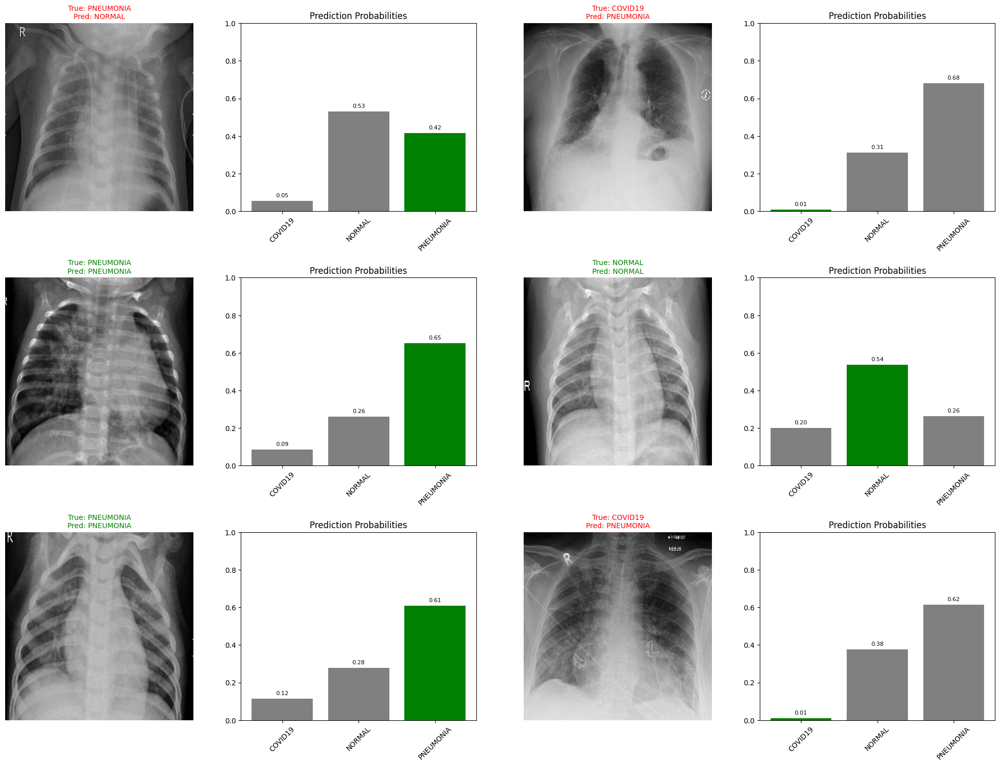

In [23]:
# Get a batch of validation/test data
val_images, val_labels = next(test_generator)

# Get predictions
predictions = model.predict(val_images)

# Display 3 rows × 2 columns = 6 image + graph pairs
i_multiplier = 5  # set this if looping batches later
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(5 * 2 * num_cols, 5 * num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_pred(predictions, val_labels, val_images, n=i + i_multiplier)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_pred_conf(predictions, val_labels, n=i + i_multiplier)

plt.tight_layout(h_pad=2.0)
plt.show()


# Making a Function to Plot the Same for our Custom Data

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import os

def load_and_prep_image(filename, img_shape=224):
    """
    Loads and preprocesses image from filename.
    """
    img = tf.io.read_file(filename)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, size=[img_shape, img_shape])
    img = img / 255.0  # normalize
    return img

def predict_and_plot_from_paths(model, image_paths, class_names, img_shape=224):
    num_images = len(image_paths)

    # Setup figure size
    num_cols = 2
    num_rows = int(np.ceil(num_images))
    plt.figure(figsize=(5 * 2 * num_cols, 5 * num_rows))

    for i, path in enumerate(image_paths):
        img = load_and_prep_image(path, img_shape=img_shape)
        img_exp = tf.expand_dims(img, axis=0)

        pred_probs = model.predict(img_exp)[0]
        pred_class = np.argmax(pred_probs)
        pred_class_name = class_names[pred_class]

        # Try to extract true class from folder structure
        true_class_name = os.path.basename(os.path.dirname(path))
        true_class_index = class_names.index(true_class_name) if true_class_name in class_names else None

        # Plot image
        plt.subplot(num_images, 2, 2*i+1)
        plt.imshow(img)
        plt.axis(False)
        title = f"Pred: {pred_class_name}"
        if true_class_index is not None:
            title += f" | True: {true_class_name}"
        plt.title(title)

        # Plot prediction confidence bar chart
        plt.subplot(num_images, 2, 2*i+2)
        bar_colors = ["green" if i == true_class_index else "gray" for i in range(len(class_names))]
        plt.bar(range(len(class_names)), pred_probs, color=bar_colors)
        plt.xticks(ticks=range(len(class_names)), labels=class_names, rotation=45)
        plt.ylim([0, 1])
        plt.title("Prediction Confidence")

    plt.tight_layout(h_pad=2.0)
    plt.show()


#### Getting File Paths of Our Images and Storing it into a list Which can be passed into our Function

In [33]:
img_path=[]
folder_path=("/content/drive/MyDrive/X-rays/test/COVID19")
for file in os.listdir(folder_path):
  full_path=os.path.join(folder_path,file)
  if os.path.isfile(full_path):
    img_path.append(full_path)
img_path[:3]

['/content/drive/MyDrive/X-rays/test/COVID19/COVID19(460).jpg',
 '/content/drive/MyDrive/X-rays/test/COVID19/COVID19(461).jpg',
 '/content/drive/MyDrive/X-rays/test/COVID19/COVID19(462).jpg']

# Here We GO !

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


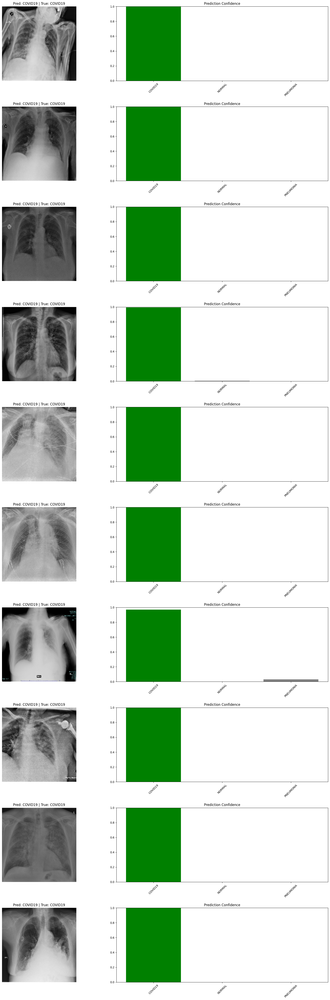

In [34]:
predict_and_plot_from_paths(model=loaded_model,image_paths=img_path[:10],class_names=labels)

# Finally Project is Completed! ✅😊